Neocognitron
group 4

In [1]:
import tensorflow.keras as keras
from tensorflow.keras import backend as K
import numpy as np
from IPython.display import display
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d
%matplotlib inline

In [2]:
# First a few tools for this -particular- example...
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.xception import preprocess_input, decode_predictions

In [3]:
def grab_image(img_path):
    img = image.load_img(img_path, target_size=(299, 299))
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    x = preprocess_input(x)
    return x
X = np.concatenate(
 [grab_image('xception_example/images/image_%d.JPEG'%(i))
 for i in range(100)])
X.shape


(100, 299, 299, 3)

In [4]:
# Let's load up the model
# This will load up the architecture
# and then the pre-trained weights from the
# internet...
model = Xception(weights='imagenet')



image  0


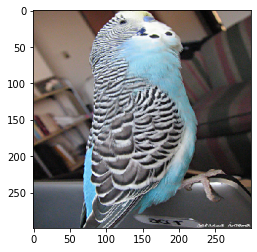

African_grey


image  1


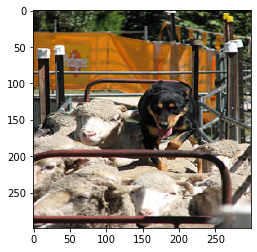

Rottweiler,   black-and-tan_coonhound


image  2


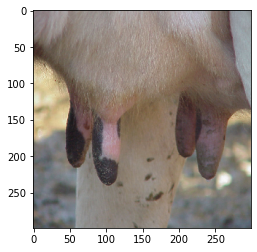

hog,   dalmatian


image  3


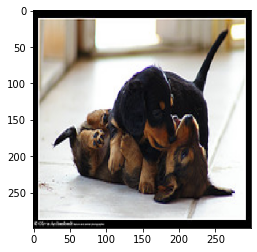

Gordon_setter


image  4


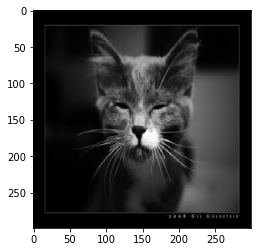

Egyptian_cat


image  5


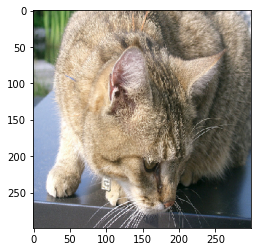

lynx


image  6


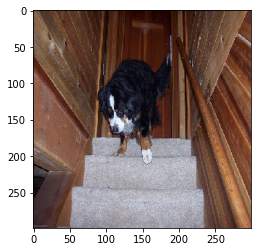

Bernese_mountain_dog


image  7


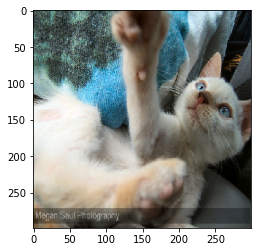

Persian_cat


image  8


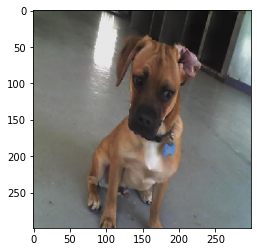

Staffordshire_bullterrier


image  9


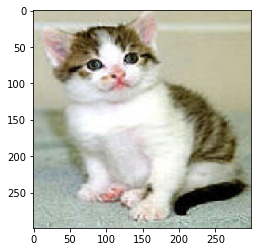

tabby


image  10


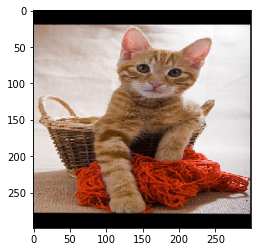

tabby,   Egyptian_cat


image  11


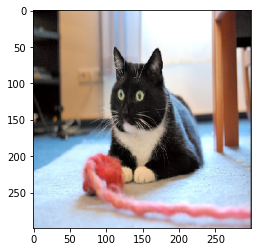

Egyptian_cat,   Siamese_cat,   tabby


image  12


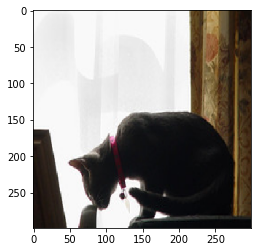

Boston_bull,   Egyptian_cat,   radiator,   sliding_door,   laptop


image  13


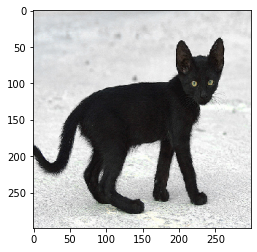

Egyptian_cat


image  14


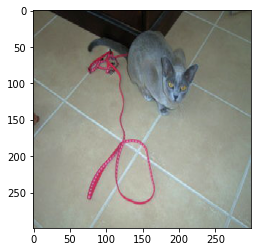

Siamese_cat,   Egyptian_cat


image  15


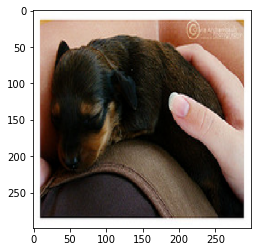

miniature_pinscher,   Chihuahua,   Brabancon_griffon,   Border_terrier,   toy_terrier


image  16


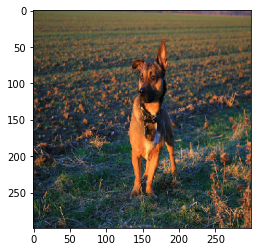

German_shepherd


image  17


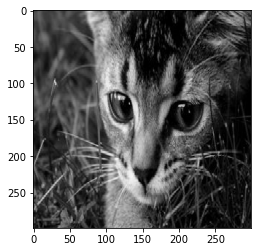

tabby


image  18


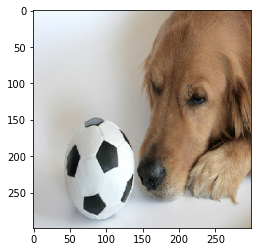

soccer_ball


image  19


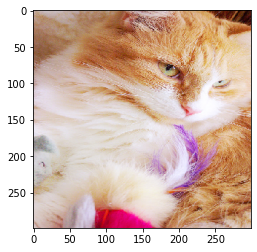

feather_boa


image  20


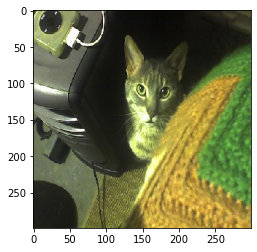

mouse,   dishrag,   joystick,   tabby


image  21


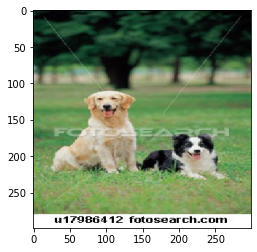

Border_collie,   golden_retriever


image  22


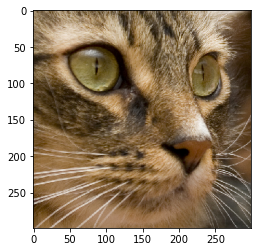

tabby


image  23


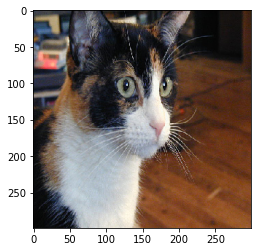

Egyptian_cat,   tabby


image  24


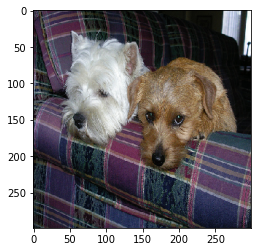

Norfolk_terrier


image  25


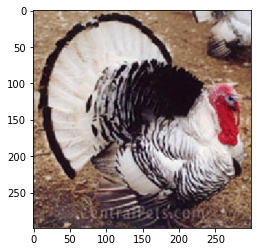

prairie_chicken,   hen,   goose,   black_grouse


image  26


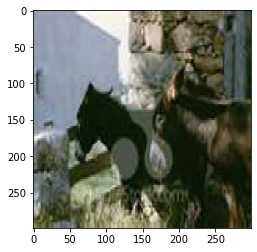

siamang,   kelpie,   groenendael


image  27


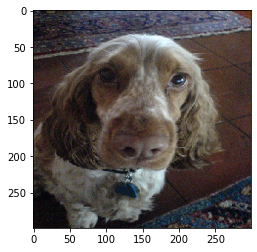

cocker_spaniel


image  28


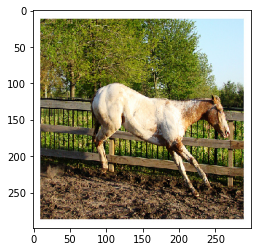

sorrel


image  29


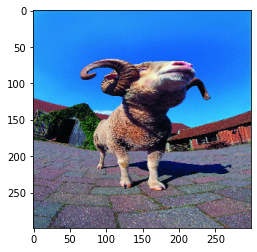

ram


image  30


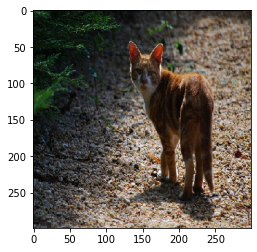

Egyptian_cat,   tiger_cat


image  31


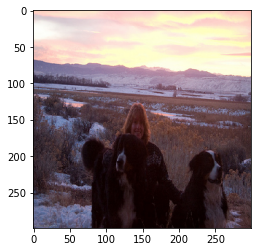

Bernese_mountain_dog


image  32


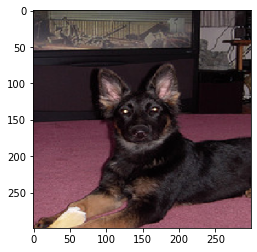

German_shepherd


image  33


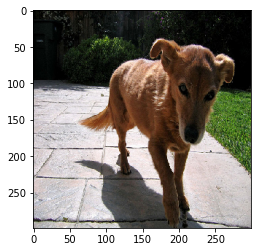

dingo


image  34


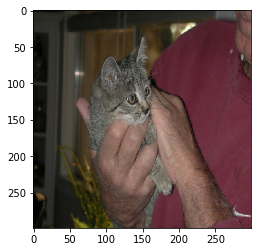

lynx


image  35


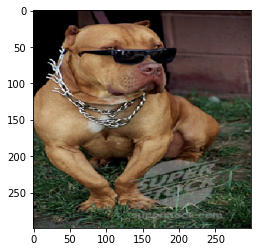

bull_mastiff


image  36


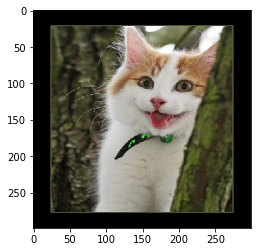

tiger_cat,   Egyptian_cat


image  37


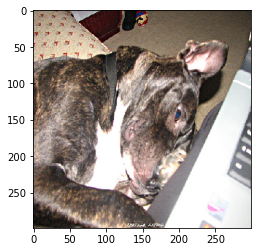

American_Staffordshire_terrier


image  38


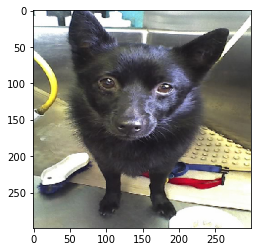

schipperke


image  39


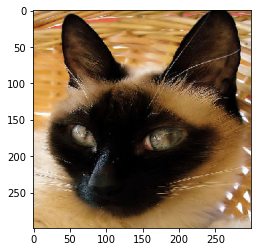

Siamese_cat


image  40


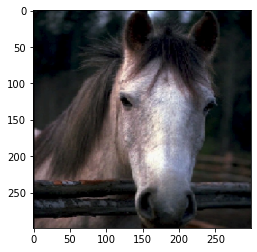

sorrel


image  41


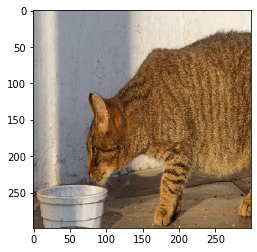

tiger_cat


image  42


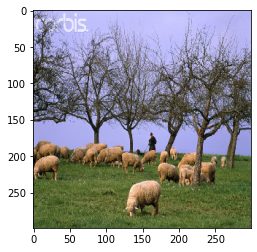

ram


image  43


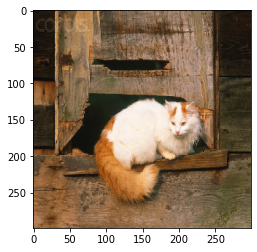

tiger_cat


image  44


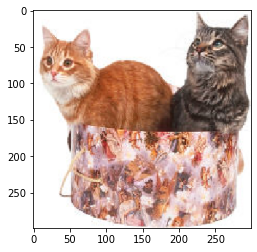

tabby


image  45


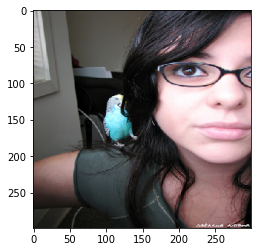

seat_belt,   wig,   hand_blower,   hair_spray,   sunglasses


image  46


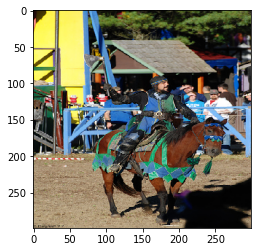

shield,   horse_cart,   barrel,   maypole


image  47


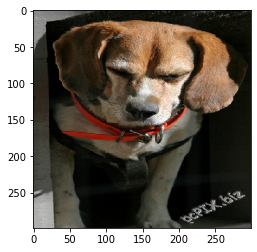

beagle


image  48


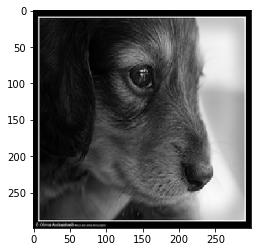

cocker_spaniel,   golden_retriever,   Brittany_spaniel


image  49


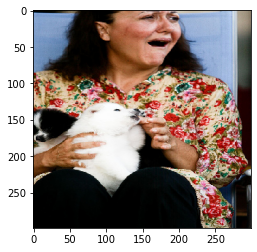

Japanese_spaniel,   papillon


image  50


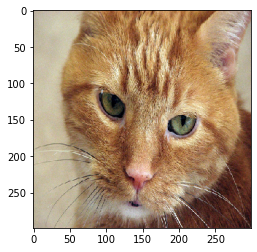

tiger_cat


image  51


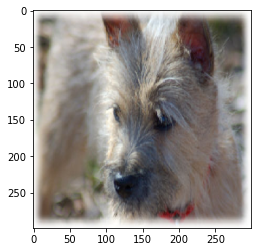

Norwich_terrier


image  52


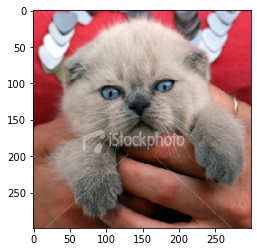

Persian_cat


image  53


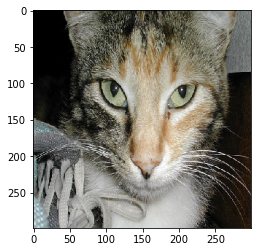

tabby


image  54


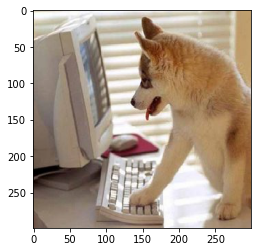

malamute


image  55


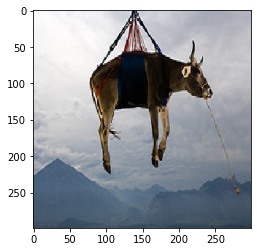

ox


image  56


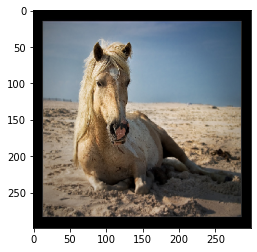

sorrel,   lion


image  57


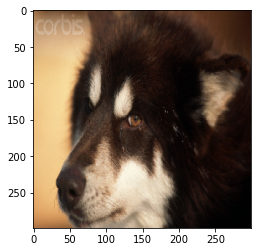

malamute


image  58


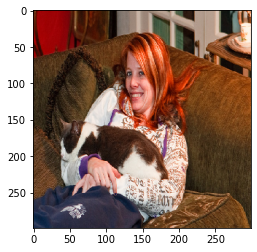

English_springer,   Boston_bull


image  59


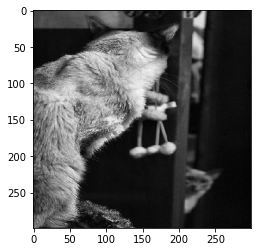

Norwegian_elkhound


image  60


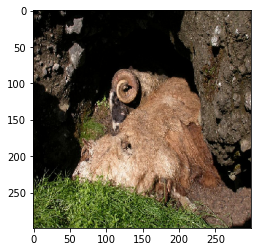

ram


image  61


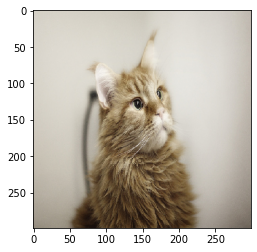

Persian_cat


image  62


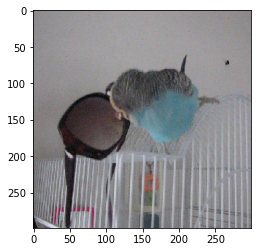

sunglasses,   sunglass


image  63


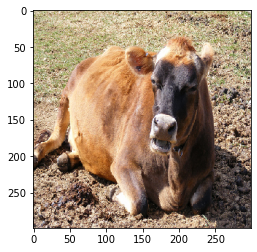

ox,   sorrel


image  64


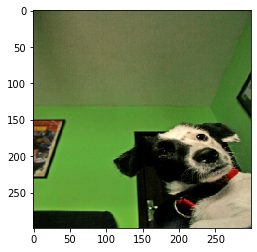

Border_collie,   dalmatian


image  65


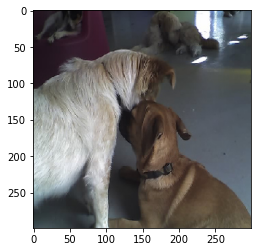

Labrador_retriever


image  66


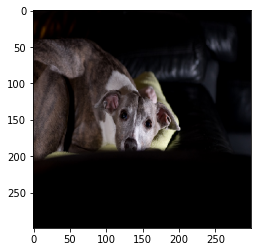

whippet


image  67


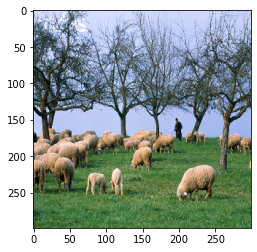

ram


image  68


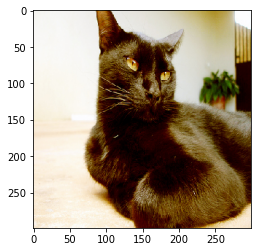

Egyptian_cat


image  69


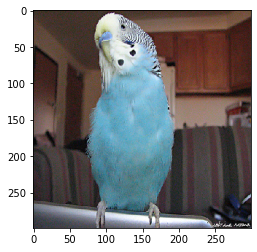

sulphur-crested_cockatoo


image  70


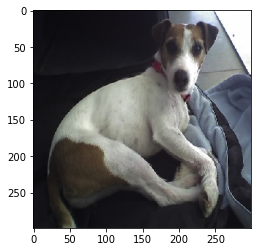

whippet


image  71


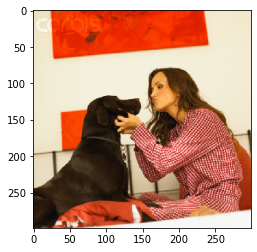

Great_Dane


image  72


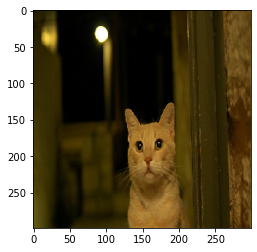

Egyptian_cat


image  73


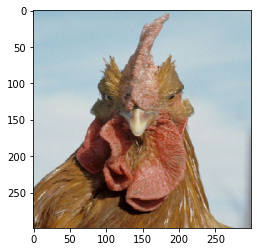

cock


image  74


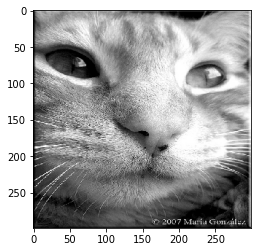

tabby


image  75


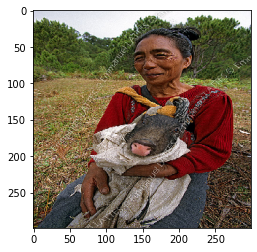

wombat,   warthog,   chain_mail,   teddy,   frilled_lizard


image  76


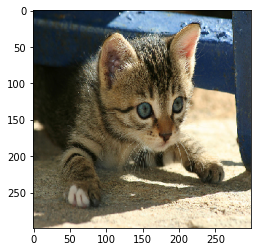

Egyptian_cat


image  77


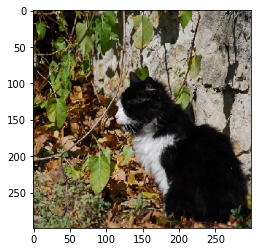

Shetland_sheepdog,   Border_collie,   collie


image  78


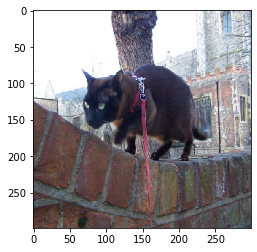

Siamese_cat,   schipperke,   Egyptian_cat


image  79


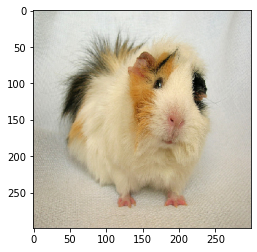

guinea_pig


image  80


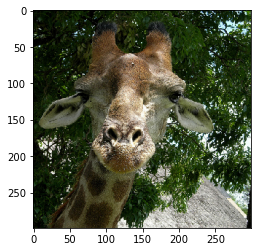

gazelle


image  81


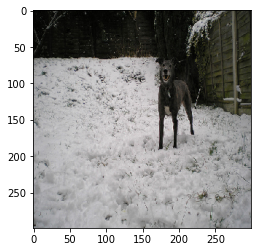

Doberman


image  82


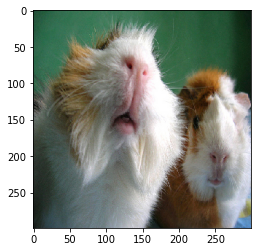

guinea_pig


image  83


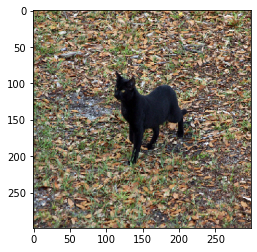

schipperke


image  84


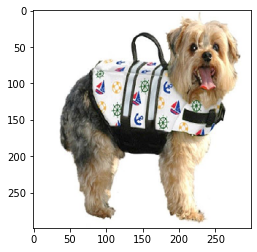

Yorkshire_terrier


image  85


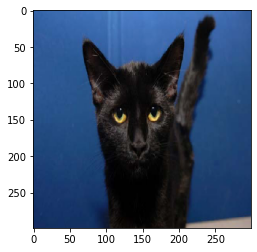

Egyptian_cat


image  86


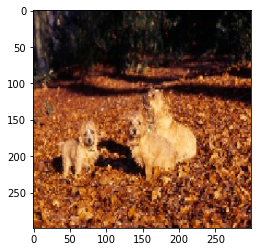

meerkat


image  87


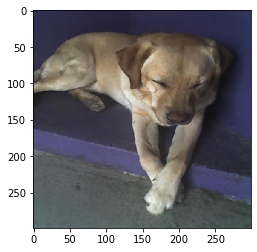

Labrador_retriever


image  88


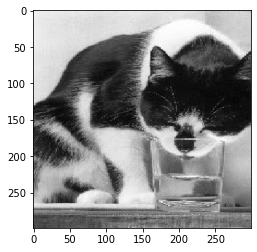

washbasin,   tabby,   Egyptian_cat


image  89


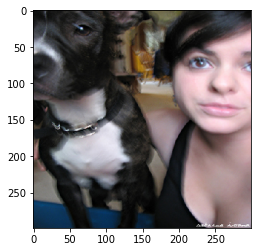

Staffordshire_bullterrier


image  90


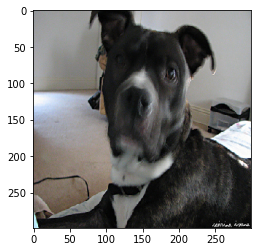

Staffordshire_bullterrier


image  91


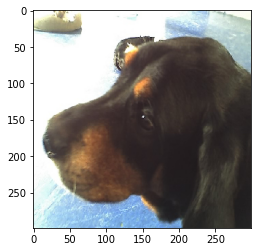

black-and-tan_coonhound


image  92


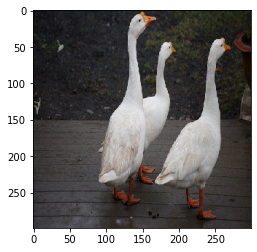

goose


image  93


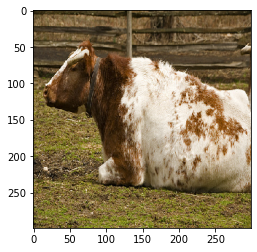

ox


image  94


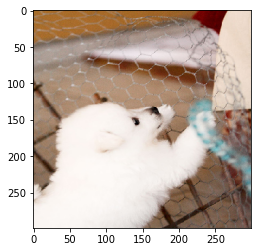

Samoyed


image  95


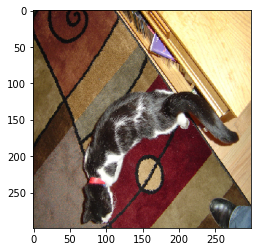

doormat


image  96


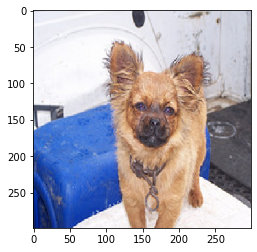

Chihuahua,   Norwich_terrier,   Pomeranian


image  97


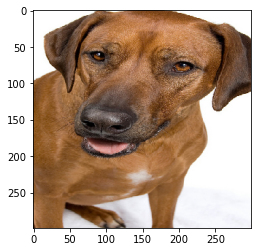

Rhodesian_ridgeback


image  98


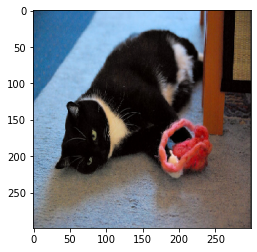

Pembroke


image  99


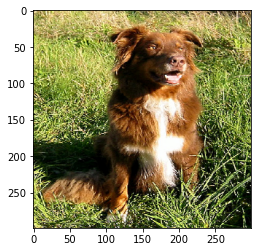

collie

0 [('n01817953', 'African_grey', 0.44841573), ('n01608432', 'kite', 0.037295207), ('n01819313', 'sulphur-crested_cockatoo', 0.016664146), ('n01798484', 'prairie_chicken', 0.010966347), ('n01807496', 'partridge', 0.01068627)] 

1 [('n02106550', 'Rottweiler', 0.2995372), ('n02089078', 'black-and-tan_coonhound', 0.10144197), ('n02105412', 'kelpie', 0.056143362), ('n02107142', 'Doberman', 0.04510364), ('n02101006', 'Gordon_setter', 0.02130682)] 

2 [('n02395406', 'hog', 0.14157914), ('n02110341', 'dalmatian', 0.044943493), ('n02403003', 'ox', 0.027563395), ('n02927161', 'butcher_shop', 0.025331892), ('n02437616', 'llama', 0.02196611)] 

3 [('n02101006', 'Gordon_setter', 0.39297733), ('n02088466', 'bloodhound', 0.12664013), ('n02089078', 'black-and-tan_coonhound', 0.051991995), ('n02112706', 'Brabancon_griffon', 0.047505025), ('n02102480', 'Sussex_spaniel', 0.04556096)] 

4 [('n02124075', 'Egyptian_cat', 0.5785851), ('n02123045', 'tabby', 0.19985548), ('n02123159', 'tiger_cat', 0.06

In [14]:
# Just the first image that we say above...
preds = model.predict(X[:,:,:,:])
# Decode the results into a list of tuples (class, description, probability)
# (one such list for each sample in the batch)
for i in range (0,100):
    print("\nimage ", i)
    plt.imshow(image.array_to_img(X[i,:,:,:]))
    plt.show() 
    W=(decode_predictions(preds,top=5)[i])
    Sum=0
    Sum+=((W[0])[-1])
    j=1
    print((W[0])[1], end='')
    while ((Sum<.45)&(j<5)):     # Captions derived from the top 45% of probabilities within the top 5 predictions
        if ((W[j])[-1]>.04):     # 4% is the minimum probability to qualify as a caption
            Sum+=((W[j])[-1])
            if(Sum<0.45):
                print(',  ',(W[j])[1], end='')
        j=j+1
    print('\n')
for i in range (0,100):
    print(i, decode_predictions (preds,top=5)[i],'\n')